In [ ]:
import datetime
from collections import defaultdict

import numpy as np
import earthkit.data as ekd
# import earthkit.regrid as ekr

from anemoi.inference.runners.simple import SimpleRunner
from anemoi.inference.outputs.printer import print_state

from ecmwf.opendata import Client as OpendataClient
import time

from scipy.sparse import load_npz
import logging
import pickle
import xarray as xr
import pandas as pd
import os

logging.basicConfig(
    level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s"
)

In [28]:
CHECKPOINT = "aifs-single-mse-1.0.ckpt"
LATLON_N320_PATH = "EKR/mir_16_linear/9533e90f8433424400ab53c7fafc87ba1a04453093311c0b5bd0b35fedc1fb83.npz"
TFM_LATLON_N320 = load_npz(LATLON_N320_PATH)
N320_LATLON_PATH = "EKR/mir_16_linear/7f0be51c7c1f522592c7639e0d3f95bcbff8a044292aa281c1e73b842736d9bf.npz"
TFM_N320_LATLON = load_npz(N320_LATLON_PATH)
ERA5_PATH = "gs://gcp-public-data-arco-era5/ar/full_37-1h-0p25deg-chunk-1.zarr-v3"
FULL_ERA5 = xr.open_zarr(ERA5_PATH, chunks=None)
LATITUDES = np.linspace(90, -90, 721)
LONGITUDES = np.linspace(0, 359.75, 1440)

INPUT_STATE_PATH = "input_states"
OUTPUT_STATE_PATH = "output_states"

for path in [INPUT_STATE_PATH, OUTPUT_STATE_PATH]:
    if not os.path.exists(path):
        os.makedirs(path)

In [33]:
def get_latest_IFS_data():
    logging.info("Using the latest IFS data from ECMWF OpenData")
    IFS_PARAM_SFC = [
        "10u",
        "10v",
        "2d",
        "2t",
        "msl",
        "skt",
        "sp",
        "tcw",
        "lsm",
        "z",
        "slor",
        "sdor",
    ]
    IFS_PARAM_SOIL = ["vsw", "sot"]
    IFS_PARAM_PL = ["gh", "t", "u", "v", "w", "q"]
    IFS_LEVELS = [1000, 925, 850, 700, 600, 500, 400, 300, 250, 200, 150, 100, 50]
    IFS_SOIL_LEVELS = [1, 2]

    DATE = OpendataClient().latest()
    logging.info(f"Initial date is {DATE}")

    def get_open_data(param, levelist=[]):
        fields = defaultdict(list)
        # Get the data for the current date and the previous date
        for date in [DATE - datetime.timedelta(hours=6), DATE]:
            data = ekd.from_source(
                "ecmwf-open-data", date=date, param=param, levelist=levelist
            )
            for f in data:
                # Open data is between -180 and 180, we need to shift it to 0-360
                assert f.to_numpy().shape == (721, 1440)
                values = np.roll(f.to_numpy(), -f.shape[1] // 2, axis=1)
                # Interpolate the data to from 0.25 to N320
                # values = ekr.interpolate(
                #     values, {"grid": (0.25, 0.25)}, {"grid": "N320"}
                # )
                values = TFM_LATLON_N320 * values
                # Add the values to the list
                name = (
                    f"{f.metadata('param')}_{f.metadata('levelist')}"
                    if levelist
                    else f.metadata("param")
                )
                fields[name].append(values)

        # Create a single matrix for each parameter
        for param, values in fields.items():
            fields[param] = np.stack(values)

        return fields

    # Create empty fields dictionary
    fields = {}
    # Get the surface parameters
    fields.update(get_open_data(param=IFS_PARAM_SFC))
    # Get the soil parameters
    soil = get_open_data(param=IFS_PARAM_SOIL, levelist=IFS_SOIL_LEVELS)

    # Map the soil parameters to the expected names
    mapping = {"sot_1": "stl1", "sot_2": "stl2", "vsw_1": "swvl1", "vsw_2": "swvl2"}
    for k, v in soil.items():
        fields[mapping[k]] = v

    # Get the pressure level parameters
    fields.update(get_open_data(param=IFS_PARAM_PL, levelist=IFS_LEVELS))

    # Transform GH to Z
    for level in IFS_LEVELS:
        gh = fields.pop(f"gh_{level}")
        fields[f"z_{level}"] = gh * 9.80665

    input_state = dict(date=DATE, fields=fields)
    save_path = f"{INPUT_STATE_PATH}/input_state_{DATE.strftime('%Y%m%dT%H')}_IFS.pkl"
    # write out the input state to a file with the date in the filename
    with open(save_path, "wb") as f:
        pickle.dump(input_state, f)

    return input_state


In [38]:
def get_ERA5(init_date):
    PARAM_PL_ERA5 = [
        "geopotential",
        "temperature",
        "u_component_of_wind",
        "v_component_of_wind",
        "vertical_velocity",
        "specific_humidity",
    ]
    PARAM_SFC_ERA5 = [
        "10m_u_component_of_wind",
        "10m_v_component_of_wind",
        "2m_temperature",
        "2m_dewpoint_temperature",
        "mean_sea_level_pressure",
        "skin_temperature",
        "surface_pressure",
        "total_column_water",
        "land_sea_mask",
        "geopotential_at_surface",
        "sea_surface_temperature",
        "volumetric_soil_water_layer_1",
        "volumetric_soil_water_layer_2",
        "soil_temperature_level_1",
        "soil_temperature_level_2",
        "standard_deviation_of_orography",
        "slope_of_sub_gridscale_orography",
    ]
    RENAME_SFC = {
        "10m_u_component_of_wind": "10u",
        "10m_v_component_of_wind": "10v",
        "2m_temperature": "2t",
        "2m_dewpoint_temperature": "2d",
        "mean_sea_level_pressure": "msl",
        "skin_temperature": "skt",
        "surface_pressure": "sp",
        "total_column_water": "tcw",
        "land_sea_mask": "lsm",
        "geopotential_at_surface": "z",
        "sea_surface_temperature": "sst",
        "volumetric_soil_water_layer_1": "swvl1",
        "volumetric_soil_water_layer_2": "swvl2",
        "soil_temperature_level_1": "stl1",
        "soil_temperature_level_2": "stl2",
        "standard_deviation_of_orography": "sdor",
        "slope_of_sub_gridscale_orography": "slor",
    }
    RENAME_PL = {
        "geopotential": "z",
        "temperature": "t",
        "u_component_of_wind": "u",
        "v_component_of_wind": "v",
        "vertical_velocity": "w",
        "specific_humidity": "q",
    }
    LEVELS = [1000, 925, 850, 700, 600, 500, 400, 300, 250, 200, 150, 100, 50]
    PARAM_SFC = [
        "10u",
        "10v",
        "2d",
        "2t",
        "msl",
        "skt",
        "sp",
        "tcw",
        "lsm",
        "z",
        "slor",
        "sdor",
        "stl1",
        "stl2",
        "swvl1",
        "swvl2",
    ]
    PARAM_PL = ["z", "t", "u", "v", "w", "q"]

    logging.info(f"Getting ERA5 data for date {init_date}")
    init_date_minus_6 = init_date - datetime.timedelta(hours=6)

    logging.info("Getting pressure level data...")
    pl_ds = (
        FULL_ERA5[PARAM_PL_ERA5]
        .sel(time=[init_date_minus_6, init_date], level=LEVELS)
        .compute()
        .rename(RENAME_PL)
    )

    logging.info("Getting surface level data...")
    sfc_ds = (
        FULL_ERA5[PARAM_SFC_ERA5]
        .sel(time=[init_date_minus_6, init_date])
        .compute()
        .rename(RENAME_SFC)
    )

    logging.info("Processing surface level data...")
    fields_sfc = defaultdict(list)
    for date in sfc_ds.time:
        sfc_ds_date = sfc_ds.sel(time=date)
        for param in PARAM_SFC:
            values = sfc_ds_date[param].to_numpy().flatten()
            # print(values.shape)
            # values = ekr.interpolate(values, {"grid": (0.25, 0.25)}, {"grid": "N320"})
            values = TFM_LATLON_N320 * values
            # print(values.shape)
            fields_sfc[param].append(values)

    logging.info("Processing pressure level data...")
    fields_pl = defaultdict(list)
    for date in pl_ds.time:
        pl_ds_date = pl_ds.sel(time=date)
        for param in PARAM_PL:
            for level in LEVELS:
                values = pl_ds_date[param].sel(level=level).to_numpy().flatten()
                # print(values.shape)
                # values = ekr.interpolate(
                #     values, {"grid": (0.25, 0.25)}, {"grid": "N320"}
                # )
                values = TFM_LATLON_N320 * values
                # print(values.shape)
                fields_pl[f"{param}_{level}"].append(values)

    logging.info("Making input state...")
    fields = {}
    fields.update(fields_sfc)
    fields.update(fields_pl)

    for param, values in fields.items():
        fields[param] = np.stack(values)

    input_state = dict(date=init_date, fields=fields)

    logging.info("Saving input state to file...")
    save_path = f"{INPUT_STATE_PATH}/input_state_{init_date.strftime('%Y%m%dT%H')}_ERA5.pkl"
    with open(save_path, "wb") as f:
        pickle.dump(input_state, f)
        logging.info(f"Input state saved to {save_path}")

    logging.info(f"Input state for {init_date} created successfully.")
    return input_state

In [35]:
def process_step(output_state, runcount):
    data_vars = {}
    logging.info(f"Processing step {runcount}")
    for field in output_state['fields']:
        values = (TFM_N320_LATLON * output_state['fields'][field].reshape(-1,1)).reshape(721,1440)
        data_vars[field] = (["lat", "lon"], values.astype(np.float32))

    step_ds = xr.Dataset(
        data_vars,
        coords={"lat": LATITUDES, "lon": LONGITUDES},
    )
    step_ds = step_ds.expand_dims('step')
    step_ds['step'] = [int(runcount)]
    return step_ds

In [39]:
def run_inference(init_date = None, lead_time=360, save_vars=None):

    if lead_time < 6 or lead_time % 6 != 0:
        raise ValueError("Lead time must be a multiple of 6 hours and at least 6 hours.")

    if save_vars is None and lead_time > 120:
        logging.warning("Running this model for more than 120 steps and saving all variables is not recommended.")

    if init_date is None:
        ic_src = "IFS"
    else:
        ic_src = "ERA5"

    save_path = f"{OUTPUT_STATE_PATH}/init_{ic_src}_{init_date.strftime('%Y%m%dT%H')}_lead_{lead_time}.zarr"
    if os.path.exists(save_path):
        logging.info(f"Output file {save_path} already exists. Skipping inference.")
        logging.info("Loading existing dataset...")
        return xr.open_zarr(save_path)
    else:
        if ic_src == "IFS":
            input_state = get_latest_IFS_data()
        else:
            input_state = get_ERA5(init_date)
    
    runner = SimpleRunner(CHECKPOINT, device="cuda")
    current_step = 0
    start_time = time.perf_counter()
    print("Starting the inference session...")
    current_step_time = time.perf_counter()
    states = []
    for state in runner.run(input_state=input_state, lead_time=lead_time):
        print_state(state)
        current_step += 6
        if save_vars is None:
            processed_state = process_step(state, current_step)
        else:
            selected_data = {
                'date': state['date'],
                'fields': {var: state['fields'][var] for var in save_vars},
                'latitudes': state['latitudes'],
                'longitudes': state['longitudes'],
            }
            processed_state = process_step(selected_data, current_step)
        states.append(processed_state)
        logging.info(f"Step {current_step} completed.")
        # tell the user how long it took to complete the step
        step_time = time.perf_counter()
        time_taken = step_time - current_step_time
        logging.info(f"Time taken for step {current_step}: {time_taken:.2f} seconds.")
        current_step_time = step_time
    logging.info("Inference session completed.")
    logging.info(
        f"Total time taken for the inference session: {time.perf_counter() - start_time:.2f} seconds."
    )
    
    logging.info("Concatenating all steps into a single dataset.")
    ds = xr.concat(states, dim='step')
    del states
    ds = ds.expand_dims("time")
    ds["time"] = [pd.to_datetime(input_state['date'])]

    logging.info(f"Saving output dataset to {save_path}")
    ds.to_zarr(save_path, mode='w')

    return ds

In [ ]:
init_date = datetime.datetime(2023, 6, 1, 0, 0)
lead_time = 360  # in hours
save_vars = ["2t", "tp"]

if __name__ == "__main__":
    output_ds = run_inference(init_date=init_date, lead_time=lead_time, save_vars=save_vars)
    # display(output_ds)
    logging.info("Inference completed successfully.")


INFO:root:Getting ERA5 data for date 2023-06-01 00:00:00
INFO:root:Getting pressure level data...


INFO:root:Getting surface level data...
INFO:root:Processing surface level data...
INFO:root:Processing pressure level data...
INFO:root:Making input state...
INFO:root:Saving input state to file...
INFO:root:Input state saved to input_states/input_state_20230601T00_ERA5.pkl
INFO:root:Input state for 2023-06-01 00:00:00 created successfully.
INFO:anemoi.inference.runner:Using SimpleRunner runner
INFO:anemoi.inference.metadata:Computed constant forcings: before ['cos_latitude', 'cos_longitude', 'sin_latitude', 'sin_longitude'], after ['cos_latitude', 'cos_longitude', 'sin_latitude', 'sin_longitude']
INFO:anemoi.inference.runners.simple:Constant computed forcing: ComputedForcings(['cos_latitude', 'cos_longitude', 'sin_latitude', 'sin_longitude'])
INFO:anemoi.inference.runners.simple:Dynamic computed forcing: ComputedForcings(['cos_julian_day', 'cos_local_time', 'sin_julian_day', 'sin_local_time', 'insolation'])
INFO:anemoi.inference.runner:Constant forcings input: ComputedForcings(['cos_

Starting the inference session...


INFO:anemoi.inference.runner:Preparing input tensor with shape (2, 103, 542080)
INFO:anemoi.utils.timer:Loading Checkpoint(aifs-single-mse-1.0.ckpt): 8 seconds.
INFO:anemoi.inference.runner:Using autocast torch.float16
INFO:anemoi.inference.runner:Lead time: 15 days, 0:00:00, time stepping: 6:00:00 Forecasting 60 steps
INFO:anemoi.inference.runner:Forecasting step 6:00:00 (2023-06-01 06:00:00)
INFO:root:Processing step 6
INFO:root:Step 6 completed.
INFO:root:Time taken for step 6: 12.66 seconds.
INFO:anemoi.inference.runner:Forecasting step 12:00:00 (2023-06-01 12:00:00)



😀 date=2023-06-01T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.03037e-06    max=3.1769e-06    
    t_1000 shape=(542080,) min=231.217        max=317.003       
    v_925  shape=(542080,) min=-34.2506       max=39.2078       
    z_850  shape=(542080,) min=9376.25        max=15858         
    swvl2  shape=(542080,) min=0              max=0.76118       
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 12
INFO:root:Step 12 completed.
INFO:root:Time taken for step 12: 2.63 seconds.
INFO:anemoi.inference.runner:Forecasting step 18:00:00 (2023-06-01 18:00:00)



😀 date=2023-06-01T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.0884e-06     max=3.17782e-06   
    t_1000 shape=(542080,) min=230.577        max=319.316       
    v_925  shape=(542080,) min=-33.5303       max=37.8238       
    z_850  shape=(542080,) min=9499.99        max=15827.5       
    swvl2  shape=(542080,) min=0              max=0.760373      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 18
INFO:root:Step 18 completed.
INFO:root:Time taken for step 18: 2.67 seconds.
INFO:anemoi.inference.runner:Forecasting step 1 day, 0:00:00 (2023-06-02 00:00:00)



😀 date=2023-06-01T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.14639e-06    max=3.18163e-06   
    t_1000 shape=(542080,) min=230.072        max=316.675       
    v_925  shape=(542080,) min=-35.8666       max=37.9477       
    z_850  shape=(542080,) min=9113           max=15953.5       
    swvl2  shape=(542080,) min=0              max=0.759574      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 24
INFO:root:Step 24 completed.
INFO:root:Time taken for step 24: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 1 day, 6:00:00 (2023-06-02 06:00:00)



😀 date=2023-06-02T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.18331e-06    max=3.18238e-06   
    t_1000 shape=(542080,) min=228.532        max=317.628       
    v_925  shape=(542080,) min=-36.6504       max=41.273        
    z_850  shape=(542080,) min=8425.43        max=15981.2       
    swvl2  shape=(542080,) min=0              max=0.759034      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 30
INFO:root:Step 30 completed.
INFO:root:Time taken for step 30: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 1 day, 12:00:00 (2023-06-02 12:00:00)



😀 date=2023-06-02T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.19518e-06    max=3.17927e-06   
    t_1000 shape=(542080,) min=228.719        max=315.543       
    v_925  shape=(542080,) min=-35.1422       max=46.3063       
    z_850  shape=(542080,) min=8261.28        max=16089.4       
    swvl2  shape=(542080,) min=0              max=0.761107      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 36
INFO:root:Step 36 completed.
INFO:root:Time taken for step 36: 2.63 seconds.
INFO:anemoi.inference.runner:Forecasting step 1 day, 18:00:00 (2023-06-02 18:00:00)



😀 date=2023-06-02T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.22815e-06    max=3.18319e-06   
    t_1000 shape=(542080,) min=228.997        max=318.94        
    v_925  shape=(542080,) min=-31.7238       max=42.6837       
    z_850  shape=(542080,) min=8318.68        max=16037.9       
    swvl2  shape=(542080,) min=0              max=0.766996      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 42
INFO:root:Step 42 completed.
INFO:root:Time taken for step 42: 2.58 seconds.
INFO:anemoi.inference.runner:Forecasting step 2 days, 0:00:00 (2023-06-03 00:00:00)



😀 date=2023-06-02T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.27677e-06    max=3.18216e-06   
    t_1000 shape=(542080,) min=229.434        max=317.233       
    v_925  shape=(542080,) min=-32.5279       max=38.5505       
    z_850  shape=(542080,) min=8451.35        max=16158.2       
    swvl2  shape=(542080,) min=0              max=0.768854      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 48
INFO:root:Step 48 completed.
INFO:root:Time taken for step 48: 2.52 seconds.
INFO:anemoi.inference.runner:Forecasting step 2 days, 6:00:00 (2023-06-03 06:00:00)



😀 date=2023-06-03T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.35855e-06    max=3.18436e-06   
    t_1000 shape=(542080,) min=228.897        max=318.101       
    v_925  shape=(542080,) min=-33.2063       max=36.6877       
    z_850  shape=(542080,) min=8480.34        max=16130.6       
    swvl2  shape=(542080,) min=0              max=0.768434      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 54
INFO:root:Step 54 completed.
INFO:root:Time taken for step 54: 2.52 seconds.
INFO:anemoi.inference.runner:Forecasting step 2 days, 12:00:00 (2023-06-03 12:00:00)



😀 date=2023-06-03T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.41869e-06    max=3.18561e-06   
    t_1000 shape=(542080,) min=229.079        max=315.26        
    v_925  shape=(542080,) min=-33.8454       max=36.3309       
    z_850  shape=(542080,) min=8805.34        max=16260.7       
    swvl2  shape=(542080,) min=0              max=0.763544      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 60
INFO:root:Step 60 completed.
INFO:root:Time taken for step 60: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 2 days, 18:00:00 (2023-06-03 18:00:00)



😀 date=2023-06-03T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.46679e-06    max=3.18564e-06   
    t_1000 shape=(542080,) min=228.973        max=319.092       
    v_925  shape=(542080,) min=-33.9735       max=35.3582       
    z_850  shape=(542080,) min=8851.33        max=16193.5       
    swvl2  shape=(542080,) min=0              max=0.759554      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 66
INFO:root:Step 66 completed.
INFO:root:Time taken for step 66: 2.59 seconds.
INFO:anemoi.inference.runner:Forecasting step 3 days, 0:00:00 (2023-06-04 00:00:00)



😀 date=2023-06-03T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.51786e-06    max=3.18654e-06   
    t_1000 shape=(542080,) min=229.813        max=317.267       
    v_925  shape=(542080,) min=-35.1832       max=34.9343       
    z_850  shape=(542080,) min=8841.89        max=16267.6       
    swvl2  shape=(542080,) min=0              max=0.757473      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 72
INFO:root:Step 72 completed.
INFO:root:Time taken for step 72: 2.65 seconds.
INFO:anemoi.inference.runner:Forecasting step 3 days, 6:00:00 (2023-06-04 06:00:00)



😀 date=2023-06-04T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.53884e-06    max=3.18533e-06   
    t_1000 shape=(542080,) min=230.087        max=317.569       
    v_925  shape=(542080,) min=-34.7362       max=33.3095       
    z_850  shape=(542080,) min=8643.03        max=16218         
    swvl2  shape=(542080,) min=0              max=0.758978      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 78
INFO:root:Step 78 completed.
INFO:root:Time taken for step 78: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 3 days, 12:00:00 (2023-06-04 12:00:00)



😀 date=2023-06-04T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.54943e-06    max=3.18271e-06   
    t_1000 shape=(542080,) min=230.723        max=315.063       
    v_925  shape=(542080,) min=-34.1127       max=29.4842       
    z_850  shape=(542080,) min=8495.54        max=16305.9       
    swvl2  shape=(542080,) min=0              max=0.757721      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 84
INFO:root:Step 84 completed.
INFO:root:Time taken for step 84: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 3 days, 18:00:00 (2023-06-04 18:00:00)



😀 date=2023-06-04T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.55464e-06    max=3.18303e-06   
    t_1000 shape=(542080,) min=231.895        max=318.754       
    v_925  shape=(542080,) min=-33.4462       max=35.0323       
    z_850  shape=(542080,) min=8636.96        max=16168.3       
    swvl2  shape=(542080,) min=0              max=0.754114      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 90
INFO:root:Step 90 completed.
INFO:root:Time taken for step 90: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 4 days, 0:00:00 (2023-06-05 00:00:00)



😀 date=2023-06-04T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.55846e-06    max=3.18123e-06   
    t_1000 shape=(542080,) min=233.084        max=316.717       
    v_925  shape=(542080,) min=-34.5838       max=35.5129       
    z_850  shape=(542080,) min=9220.59        max=16153.7       
    swvl2  shape=(542080,) min=0              max=0.751301      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 96
INFO:root:Step 96 completed.
INFO:root:Time taken for step 96: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 4 days, 6:00:00 (2023-06-05 06:00:00)



😀 date=2023-06-05T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.5561e-06     max=3.18222e-06   
    t_1000 shape=(542080,) min=232.657        max=316.596       
    v_925  shape=(542080,) min=-40.2524       max=32.8579       
    z_850  shape=(542080,) min=9221.24        max=16038.7       
    swvl2  shape=(542080,) min=0              max=0.750084      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 102
INFO:root:Step 102 completed.
INFO:root:Time taken for step 102: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 4 days, 12:00:00 (2023-06-05 12:00:00)



😀 date=2023-06-05T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.55642e-06    max=3.18298e-06   
    t_1000 shape=(542080,) min=232.657        max=315.25        
    v_925  shape=(542080,) min=-35.5395       max=28.4236       
    z_850  shape=(542080,) min=8940.07        max=16095.5       
    swvl2  shape=(542080,) min=0              max=0.749185      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 108
INFO:root:Step 108 completed.
INFO:root:Time taken for step 108: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 4 days, 18:00:00 (2023-06-05 18:00:00)



😀 date=2023-06-05T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.55635e-06    max=3.18158e-06   
    t_1000 shape=(542080,) min=232.691        max=318.989       
    v_925  shape=(542080,) min=-30.1912       max=30.1315       
    z_850  shape=(542080,) min=8335.53        max=15972.2       
    swvl2  shape=(542080,) min=0              max=0.748349      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 114
INFO:root:Step 114 completed.
INFO:root:Time taken for step 114: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 5 days, 0:00:00 (2023-06-06 00:00:00)



😀 date=2023-06-05T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.56208e-06    max=3.18101e-06   
    t_1000 shape=(542080,) min=232.367        max=317.209       
    v_925  shape=(542080,) min=-32.6042       max=28.6434       
    z_850  shape=(542080,) min=7801.57        max=15961.5       
    swvl2  shape=(542080,) min=0              max=0.747467      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 120
INFO:root:Step 120 completed.
INFO:root:Time taken for step 120: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 5 days, 6:00:00 (2023-06-06 06:00:00)



😀 date=2023-06-06T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.55719e-06    max=3.17996e-06   
    t_1000 shape=(542080,) min=231.202        max=315.93        
    v_925  shape=(542080,) min=-32.821        max=32.2059       
    z_850  shape=(542080,) min=7554.62        max=15843.7       
    swvl2  shape=(542080,) min=0              max=0.746787      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 126
INFO:root:Step 126 completed.
INFO:root:Time taken for step 126: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 5 days, 12:00:00 (2023-06-06 12:00:00)



😀 date=2023-06-06T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.56198e-06    max=3.17947e-06   
    t_1000 shape=(542080,) min=231.888        max=315.129       
    v_925  shape=(542080,) min=-34.3907       max=35.4675       
    z_850  shape=(542080,) min=7683.04        max=15928.2       
    swvl2  shape=(542080,) min=0              max=0.746223      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 132
INFO:root:Step 132 completed.
INFO:root:Time taken for step 132: 2.59 seconds.
INFO:anemoi.inference.runner:Forecasting step 5 days, 18:00:00 (2023-06-06 18:00:00)



😀 date=2023-06-06T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.56725e-06    max=3.17676e-06   
    t_1000 shape=(542080,) min=232.612        max=319.097       
    v_925  shape=(542080,) min=-32.4698       max=27.9914       
    z_850  shape=(542080,) min=8166.41        max=15806.2       
    swvl2  shape=(542080,) min=0              max=0.745458      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 138
INFO:root:Step 138 completed.
INFO:root:Time taken for step 138: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 6 days, 0:00:00 (2023-06-07 00:00:00)



😀 date=2023-06-06T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.54346e-06    max=3.17616e-06   
    t_1000 shape=(542080,) min=231.941        max=317.19        
    v_925  shape=(542080,) min=-31.3987       max=30.9725       
    z_850  shape=(542080,) min=8613.78        max=15860.5       
    swvl2  shape=(542080,) min=0              max=0.744606      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 144
INFO:root:Step 144 completed.
INFO:root:Time taken for step 144: 2.60 seconds.
INFO:anemoi.inference.runner:Forecasting step 6 days, 6:00:00 (2023-06-07 06:00:00)



😀 date=2023-06-07T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.50601e-06    max=3.17593e-06   
    t_1000 shape=(542080,) min=232.089        max=315.108       
    v_925  shape=(542080,) min=-28.7792       max=36.1359       
    z_850  shape=(542080,) min=8581.7         max=15795.8       
    swvl2  shape=(542080,) min=0              max=0.743921      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 150
INFO:root:Step 150 completed.
INFO:root:Time taken for step 150: 2.59 seconds.
INFO:anemoi.inference.runner:Forecasting step 6 days, 12:00:00 (2023-06-07 12:00:00)



😀 date=2023-06-07T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.45984e-06    max=3.17319e-06   
    t_1000 shape=(542080,) min=233.189        max=315.39        
    v_925  shape=(542080,) min=-27.1615       max=28.9916       
    z_850  shape=(542080,) min=8473.42        max=15878.2       
    swvl2  shape=(542080,) min=0              max=0.743329      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 156
INFO:root:Step 156 completed.
INFO:root:Time taken for step 156: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 6 days, 18:00:00 (2023-06-07 18:00:00)



😀 date=2023-06-07T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.46606e-06    max=3.17116e-06   
    t_1000 shape=(542080,) min=232.397        max=319.355       
    v_925  shape=(542080,) min=-28.1722       max=33.0484       
    z_850  shape=(542080,) min=8485.9         max=15781.8       
    swvl2  shape=(542080,) min=0              max=0.742748      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 162
INFO:root:Step 162 completed.
INFO:root:Time taken for step 162: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 7 days, 0:00:00 (2023-06-08 00:00:00)



😀 date=2023-06-07T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.24319e-06    max=3.17112e-06   
    t_1000 shape=(542080,) min=227.722        max=317.221       
    v_925  shape=(542080,) min=-31.4214       max=28.8593       
    z_850  shape=(542080,) min=8597.32        max=15820.9       
    swvl2  shape=(542080,) min=0              max=0.742128      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 168
INFO:root:Step 168 completed.
INFO:root:Time taken for step 168: 2.65 seconds.
INFO:anemoi.inference.runner:Forecasting step 7 days, 6:00:00 (2023-06-08 06:00:00)



😀 date=2023-06-08T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.19349e-06    max=3.17288e-06   
    t_1000 shape=(542080,) min=228.605        max=315.086       
    v_925  shape=(542080,) min=-25.3762       max=34.5695       
    z_850  shape=(542080,) min=7982.32        max=15755.3       
    swvl2  shape=(542080,) min=0              max=0.741606      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 174
INFO:root:Step 174 completed.
INFO:root:Time taken for step 174: 2.69 seconds.
INFO:anemoi.inference.runner:Forecasting step 7 days, 12:00:00 (2023-06-08 12:00:00)



😀 date=2023-06-08T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.1882e-06     max=3.17367e-06   
    t_1000 shape=(542080,) min=229.758        max=315.874       
    v_925  shape=(542080,) min=-26.5819       max=34.5675       
    z_850  shape=(542080,) min=7819.08        max=15840.6       
    swvl2  shape=(542080,) min=0              max=0.741198      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 180
INFO:root:Step 180 completed.
INFO:root:Time taken for step 180: 2.60 seconds.
INFO:anemoi.inference.runner:Forecasting step 7 days, 18:00:00 (2023-06-08 18:00:00)



😀 date=2023-06-08T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.26614e-06    max=3.17602e-06   
    t_1000 shape=(542080,) min=231.143        max=319.508       
    v_925  shape=(542080,) min=-26.8146       max=33.8348       
    z_850  shape=(542080,) min=7756.52        max=15747.5       
    swvl2  shape=(542080,) min=0              max=0.740754      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 186
INFO:root:Step 186 completed.
INFO:root:Time taken for step 186: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 8 days, 0:00:00 (2023-06-09 00:00:00)



😀 date=2023-06-08T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.2692e-06     max=3.17798e-06   
    t_1000 shape=(542080,) min=232.133        max=317.579       
    v_925  shape=(542080,) min=-32.3177       max=37.3529       
    z_850  shape=(542080,) min=7781.84        max=15996.5       
    swvl2  shape=(542080,) min=0              max=0.740132      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 192
INFO:root:Step 192 completed.
INFO:root:Time taken for step 192: 2.57 seconds.
INFO:anemoi.inference.runner:Forecasting step 8 days, 6:00:00 (2023-06-09 06:00:00)



😀 date=2023-06-09T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.34373e-06    max=3.1827e-06    
    t_1000 shape=(542080,) min=232.842        max=315.598       
    v_925  shape=(542080,) min=-38.6536       max=37.6152       
    z_850  shape=(542080,) min=8079.75        max=16031.4       
    swvl2  shape=(542080,) min=0              max=0.739655      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 198
INFO:root:Step 198 completed.
INFO:root:Time taken for step 198: 2.49 seconds.
INFO:anemoi.inference.runner:Forecasting step 8 days, 12:00:00 (2023-06-09 12:00:00)



😀 date=2023-06-09T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.40837e-06    max=3.18611e-06   
    t_1000 shape=(542080,) min=233.418        max=316.707       
    v_925  shape=(542080,) min=-39.4386       max=39.1938       
    z_850  shape=(542080,) min=8416.74        max=15989.6       
    swvl2  shape=(542080,) min=0              max=0.739437      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 204
INFO:root:Step 204 completed.
INFO:root:Time taken for step 204: 2.50 seconds.
INFO:anemoi.inference.runner:Forecasting step 8 days, 18:00:00 (2023-06-09 18:00:00)



😀 date=2023-06-09T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.42313e-06    max=3.18787e-06   
    t_1000 shape=(542080,) min=234.532        max=320.234       
    v_925  shape=(542080,) min=-38.8554       max=39.286        
    z_850  shape=(542080,) min=8713.63        max=16040.8       
    swvl2  shape=(542080,) min=0              max=0.739272      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 210
INFO:root:Step 210 completed.
INFO:root:Time taken for step 210: 2.54 seconds.
INFO:anemoi.inference.runner:Forecasting step 9 days, 0:00:00 (2023-06-10 00:00:00)



😀 date=2023-06-09T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.41141e-06    max=3.18839e-06   
    t_1000 shape=(542080,) min=234.309        max=318.266       
    v_925  shape=(542080,) min=-37.4367       max=41.2735       
    z_850  shape=(542080,) min=7814.79        max=16273.5       
    swvl2  shape=(542080,) min=0              max=0.738899      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 216
INFO:root:Step 216 completed.
INFO:root:Time taken for step 216: 2.51 seconds.
INFO:anemoi.inference.runner:Forecasting step 9 days, 6:00:00 (2023-06-10 06:00:00)



😀 date=2023-06-10T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.41693e-06    max=3.18513e-06   
    t_1000 shape=(542080,) min=233.844        max=316.113       
    v_925  shape=(542080,) min=-35.3417       max=41.0641       
    z_850  shape=(542080,) min=7403.56        max=16324.6       
    swvl2  shape=(542080,) min=0              max=0.738494      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 222
INFO:root:Step 222 completed.
INFO:root:Time taken for step 222: 2.65 seconds.
INFO:anemoi.inference.runner:Forecasting step 9 days, 12:00:00 (2023-06-10 12:00:00)



😀 date=2023-06-10T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.40765e-06    max=3.18228e-06   
    t_1000 shape=(542080,) min=233.47         max=316.914       
    v_925  shape=(542080,) min=-34.2481       max=43.3755       
    z_850  shape=(542080,) min=7461.94        max=16455.4       
    swvl2  shape=(542080,) min=0              max=0.738023      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 228
INFO:root:Step 228 completed.
INFO:root:Time taken for step 228: 2.63 seconds.
INFO:anemoi.inference.runner:Forecasting step 9 days, 18:00:00 (2023-06-10 18:00:00)



😀 date=2023-06-10T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.39111e-06    max=3.18203e-06   
    t_1000 shape=(542080,) min=234.59         max=319.984       
    v_925  shape=(542080,) min=-33.1028       max=43.709        
    z_850  shape=(542080,) min=7745.2         max=16456.5       
    swvl2  shape=(542080,) min=0              max=0.737667      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 234
INFO:root:Step 234 completed.
INFO:root:Time taken for step 234: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 10 days, 0:00:00 (2023-06-11 00:00:00)



😀 date=2023-06-10T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.28525e-06    max=3.18481e-06   
    t_1000 shape=(542080,) min=235.021        max=318.41        
    v_925  shape=(542080,) min=-30.4105       max=42.6099       
    z_850  shape=(542080,) min=7971.74        max=16569.5       
    swvl2  shape=(542080,) min=0              max=0.737149      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 240
INFO:root:Step 240 completed.
INFO:root:Time taken for step 240: 2.58 seconds.
INFO:anemoi.inference.runner:Forecasting step 10 days, 6:00:00 (2023-06-11 06:00:00)



😀 date=2023-06-11T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.26866e-06    max=3.18592e-06   
    t_1000 shape=(542080,) min=235.597        max=317.181       
    v_925  shape=(542080,) min=-29.2186       max=41.3332       
    z_850  shape=(542080,) min=8233.99        max=16495.4       
    swvl2  shape=(542080,) min=0              max=0.736662      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 246
INFO:root:Step 246 completed.
INFO:root:Time taken for step 246: 2.59 seconds.
INFO:anemoi.inference.runner:Forecasting step 10 days, 12:00:00 (2023-06-11 12:00:00)



😀 date=2023-06-11T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.25964e-06    max=3.19157e-06   
    t_1000 shape=(542080,) min=236.181        max=316.297       
    v_925  shape=(542080,) min=-28.002        max=40.826        
    z_850  shape=(542080,) min=8233.91        max=16490.3       
    swvl2  shape=(542080,) min=0              max=0.736037      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 252
INFO:root:Step 252 completed.
INFO:root:Time taken for step 252: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 10 days, 18:00:00 (2023-06-11 18:00:00)



😀 date=2023-06-11T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.26801e-06    max=3.19227e-06   
    t_1000 shape=(542080,) min=236.303        max=319.303       
    v_925  shape=(542080,) min=-28.1625       max=39.6152       
    z_850  shape=(542080,) min=7554.2         max=16388.3       
    swvl2  shape=(542080,) min=0              max=0.735486      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 258
INFO:root:Step 258 completed.
INFO:root:Time taken for step 258: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 11 days, 0:00:00 (2023-06-12 00:00:00)



😀 date=2023-06-11T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.20426e-06    max=3.19158e-06   
    t_1000 shape=(542080,) min=236.878        max=318.215       
    v_925  shape=(542080,) min=-28.7518       max=39.8035       
    z_850  shape=(542080,) min=7133.65        max=16454.9       
    swvl2  shape=(542080,) min=0              max=0.734935      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 264
INFO:root:Step 264 completed.
INFO:root:Time taken for step 264: 2.62 seconds.
INFO:anemoi.inference.runner:Forecasting step 11 days, 6:00:00 (2023-06-12 06:00:00)



😀 date=2023-06-12T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.14996e-06    max=3.19144e-06   
    t_1000 shape=(542080,) min=236.47         max=318.844       
    v_925  shape=(542080,) min=-29.6862       max=40.0761       
    z_850  shape=(542080,) min=7115.76        max=16362.6       
    swvl2  shape=(542080,) min=0              max=0.734472      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 270
INFO:root:Step 270 completed.
INFO:root:Time taken for step 270: 2.59 seconds.
INFO:anemoi.inference.runner:Forecasting step 11 days, 12:00:00 (2023-06-12 12:00:00)



😀 date=2023-06-12T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.13107e-06    max=3.19384e-06   
    t_1000 shape=(542080,) min=237.107        max=316.748       
    v_925  shape=(542080,) min=-29.5348       max=38.1803       
    z_850  shape=(542080,) min=7242.51        max=16362.1       
    swvl2  shape=(542080,) min=0              max=0.733958      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 276
INFO:root:Step 276 completed.
INFO:root:Time taken for step 276: 2.60 seconds.
INFO:anemoi.inference.runner:Forecasting step 11 days, 18:00:00 (2023-06-12 18:00:00)



😀 date=2023-06-12T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.20654e-06    max=3.19414e-06   
    t_1000 shape=(542080,) min=237.286        max=320.493       
    v_925  shape=(542080,) min=-28.9708       max=34.6649       
    z_850  shape=(542080,) min=7591.47        max=16254.7       
    swvl2  shape=(542080,) min=0              max=0.733512      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 282
INFO:root:Step 282 completed.
INFO:root:Time taken for step 282: 2.58 seconds.
INFO:anemoi.inference.runner:Forecasting step 12 days, 0:00:00 (2023-06-13 00:00:00)



😀 date=2023-06-12T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.20296e-06    max=3.19013e-06   
    t_1000 shape=(542080,) min=238.837        max=318.678       
    v_925  shape=(542080,) min=-35.7948       max=31.1671       
    z_850  shape=(542080,) min=8038.35        max=16295         
    swvl2  shape=(542080,) min=0              max=0.733051      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 288
INFO:root:Step 288 completed.
INFO:root:Time taken for step 288: 2.65 seconds.
INFO:anemoi.inference.runner:Forecasting step 12 days, 6:00:00 (2023-06-13 06:00:00)



😀 date=2023-06-13T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.18225e-06    max=3.19039e-06   
    t_1000 shape=(542080,) min=238.894        max=317.336       
    v_925  shape=(542080,) min=-31.4599       max=30.4688       
    z_850  shape=(542080,) min=8059.7         max=16222.6       
    swvl2  shape=(542080,) min=0              max=0.732663      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 294
INFO:root:Step 294 completed.
INFO:root:Time taken for step 294: 2.63 seconds.
INFO:anemoi.inference.runner:Forecasting step 12 days, 12:00:00 (2023-06-13 12:00:00)



😀 date=2023-06-13T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.17158e-06    max=3.18769e-06   
    t_1000 shape=(542080,) min=239.599        max=317.798       
    v_925  shape=(542080,) min=-29.827        max=26.9799       
    z_850  shape=(542080,) min=7894.72        max=16166.6       
    swvl2  shape=(542080,) min=0              max=0.732228      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 300
INFO:root:Step 300 completed.
INFO:root:Time taken for step 300: 2.60 seconds.
INFO:anemoi.inference.runner:Forecasting step 12 days, 18:00:00 (2023-06-13 18:00:00)



😀 date=2023-06-13T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.16846e-06    max=3.18104e-06   
    t_1000 shape=(542080,) min=240.368        max=321.283       
    v_925  shape=(542080,) min=-30.7787       max=27.1629       
    z_850  shape=(542080,) min=7963.95        max=16054.1       
    swvl2  shape=(542080,) min=0              max=0.731757      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 306
INFO:root:Step 306 completed.
INFO:root:Time taken for step 306: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 13 days, 0:00:00 (2023-06-14 00:00:00)



😀 date=2023-06-13T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.09908e-06    max=3.17972e-06   
    t_1000 shape=(542080,) min=240.566        max=318.885       
    v_925  shape=(542080,) min=-28.6286       max=26.6146       
    z_850  shape=(542080,) min=8294.04        max=16028.1       
    swvl2  shape=(542080,) min=0              max=0.731209      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 312
INFO:root:Step 312 completed.
INFO:root:Time taken for step 312: 2.69 seconds.
INFO:anemoi.inference.runner:Forecasting step 13 days, 6:00:00 (2023-06-14 06:00:00)



😀 date=2023-06-14T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.02981e-06    max=3.17982e-06   
    t_1000 shape=(542080,) min=239.436        max=318.203       
    v_925  shape=(542080,) min=-28.4817       max=29.3724       
    z_850  shape=(542080,) min=8248.04        max=16014.2       
    swvl2  shape=(542080,) min=0              max=0.730798      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 318
INFO:root:Step 318 completed.
INFO:root:Time taken for step 318: 2.68 seconds.
INFO:anemoi.inference.runner:Forecasting step 13 days, 12:00:00 (2023-06-14 12:00:00)



😀 date=2023-06-14T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=1.97653e-06    max=3.17378e-06   
    t_1000 shape=(542080,) min=239.296        max=318.483       
    v_925  shape=(542080,) min=-28.8012       max=30.1988       
    z_850  shape=(542080,) min=8375.38        max=16144.3       
    swvl2  shape=(542080,) min=0              max=0.730511      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 324
INFO:root:Step 324 completed.
INFO:root:Time taken for step 324: 2.68 seconds.
INFO:anemoi.inference.runner:Forecasting step 13 days, 18:00:00 (2023-06-14 18:00:00)



😀 date=2023-06-14T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=1.97273e-06    max=3.17235e-06   
    t_1000 shape=(542080,) min=238.726        max=321.641       
    v_925  shape=(542080,) min=-27.3669       max=30.3326       
    z_850  shape=(542080,) min=9047.56        max=16086.6       
    swvl2  shape=(542080,) min=0              max=0.730548      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 330
INFO:root:Step 330 completed.
INFO:root:Time taken for step 330: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 14 days, 0:00:00 (2023-06-15 00:00:00)



😀 date=2023-06-14T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=1.96109e-06    max=3.16846e-06   
    t_1000 shape=(542080,) min=235.12         max=319.287       
    v_925  shape=(542080,) min=-31.6746       max=27.4969       
    z_850  shape=(542080,) min=9064.51        max=16169         
    swvl2  shape=(542080,) min=0              max=0.730379      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 336
INFO:root:Step 336 completed.
INFO:root:Time taken for step 336: 2.64 seconds.
INFO:anemoi.inference.runner:Forecasting step 14 days, 6:00:00 (2023-06-15 06:00:00)



😀 date=2023-06-15T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=1.979e-06      max=3.16463e-06   
    t_1000 shape=(542080,) min=233.773        max=318.015       
    v_925  shape=(542080,) min=-29.4804       max=27.383        
    z_850  shape=(542080,) min=8773.5         max=16101.4       
    swvl2  shape=(542080,) min=0              max=0.730455      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 342
INFO:root:Step 342 completed.
INFO:root:Time taken for step 342: 2.61 seconds.
INFO:anemoi.inference.runner:Forecasting step 14 days, 12:00:00 (2023-06-15 12:00:00)



😀 date=2023-06-15T06:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=1.99175e-06    max=3.15995e-06   
    t_1000 shape=(542080,) min=235.075        max=318.324       
    v_925  shape=(542080,) min=-29.0465       max=28.3524       
    z_850  shape=(542080,) min=8389.17        max=16156.2       
    swvl2  shape=(542080,) min=0              max=0.730088      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 348
INFO:root:Step 348 completed.
INFO:root:Time taken for step 348: 2.68 seconds.
INFO:anemoi.inference.runner:Forecasting step 14 days, 18:00:00 (2023-06-15 18:00:00)



😀 date=2023-06-15T12:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.01637e-06    max=3.15933e-06   
    t_1000 shape=(542080,) min=237.009        max=321.308       
    v_925  shape=(542080,) min=-33.3594       max=30.8883       
    z_850  shape=(542080,) min=7961.91        max=16014.5       
    swvl2  shape=(542080,) min=0              max=0.729778      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 354
INFO:root:Step 354 completed.
INFO:root:Time taken for step 354: 2.65 seconds.
INFO:anemoi.inference.runner:Forecasting step 15 days, 0:00:00 (2023-06-16 00:00:00)



😀 date=2023-06-15T18:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.03569e-06    max=3.15834e-06   
    t_1000 shape=(542080,) min=237.258        max=319.308       
    v_925  shape=(542080,) min=-33.7142       max=31.8547       
    z_850  shape=(542080,) min=7813.98        max=16014.4       
    swvl2  shape=(542080,) min=0              max=0.729314      
    tcc    shape=(542080,) min=0              max=1             



INFO:root:Processing step 360
INFO:root:Step 360 completed.
INFO:root:Time taken for step 360: 2.64 seconds.
INFO:root:Inference session completed.
INFO:root:Total time taken for the inference session: 166.80 seconds.
INFO:root:Concatenating all steps into a single dataset.
INFO:root:Saving output dataset to output_states/init_ERA5_20230601T00_lead_360.zarr



😀 date=2023-06-16T00:00:00 latitudes=(542080,) longitudes=(542080,) fields=102

    q_50   shape=(542080,) min=2.05923e-06    max=3.15746e-06   
    t_1000 shape=(542080,) min=236.079        max=317.893       
    v_925  shape=(542080,) min=-29.7504       max=34.1426       
    z_850  shape=(542080,) min=7816.73        max=16066.1       
    swvl2  shape=(542080,) min=0              max=0.728903      
    tcc    shape=(542080,) min=0              max=1             



/opt/AIFS/lib/python3.11/site-packages/zarr/api/asynchronous.py:228: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


<xarray.Dataset> Size: 498MB
Dimensions:  (time: 1, step: 60, lat: 721, lon: 1440)
Coordinates:
  * lat      (lat) float64 6kB 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * lon      (lon) float64 12kB 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * step     (step) int64 480B 6 12 18 24 30 36 42 ... 330 336 342 348 354 360
  * time     (time) datetime64[ns] 8B 2023-06-01
Data variables:
    2t       (time, step, lat, lon) float32 249MB 273.2 273.2 ... 218.3 218.3
    tp       (time, step, lat, lon) float32 249MB 0.0001201 0.0001201 ... 0.0

INFO:root:Inference completed successfully.


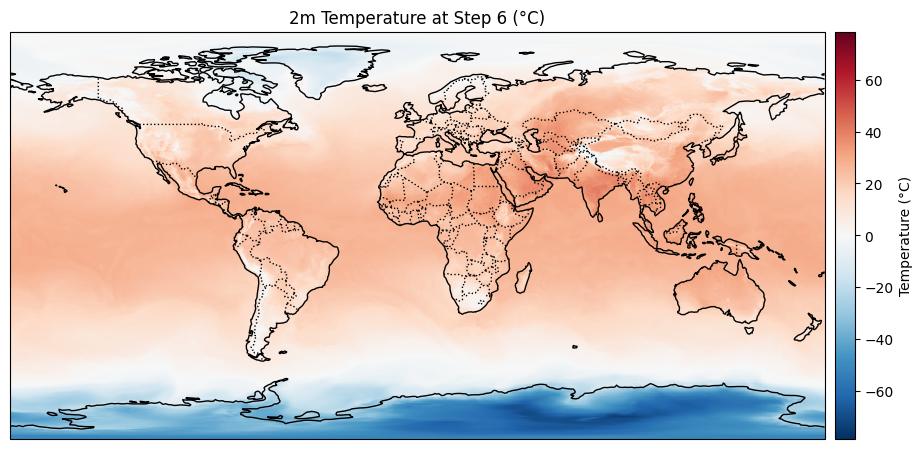

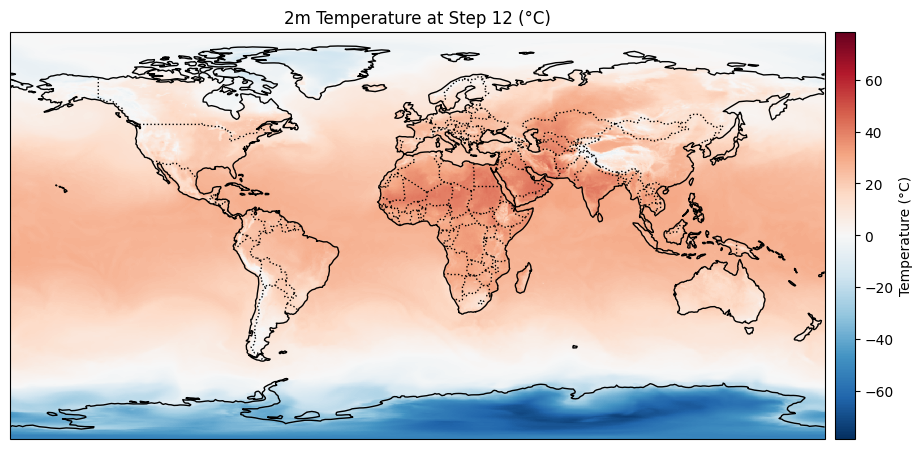

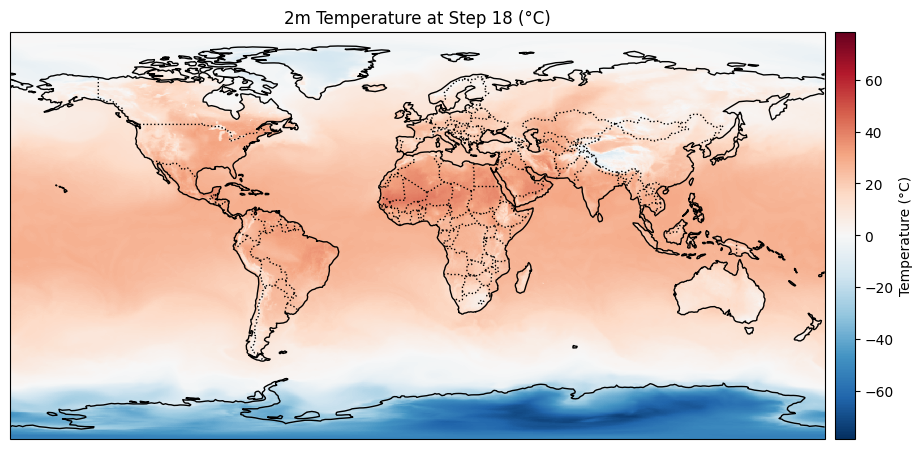

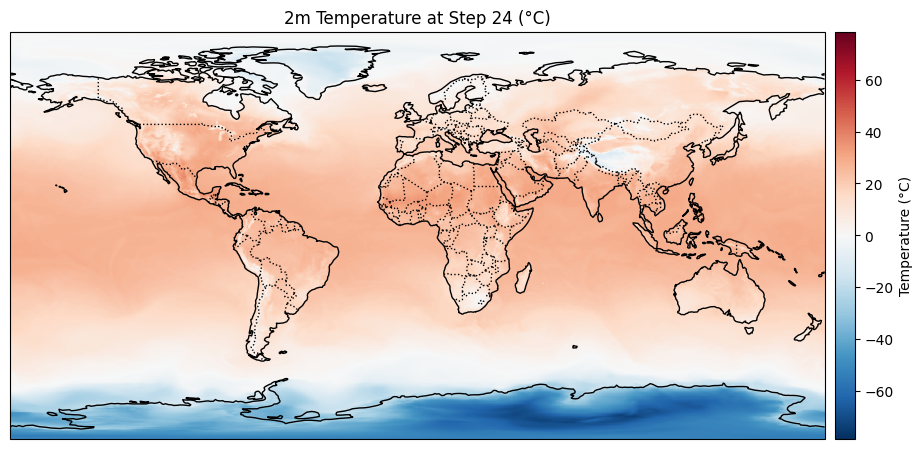

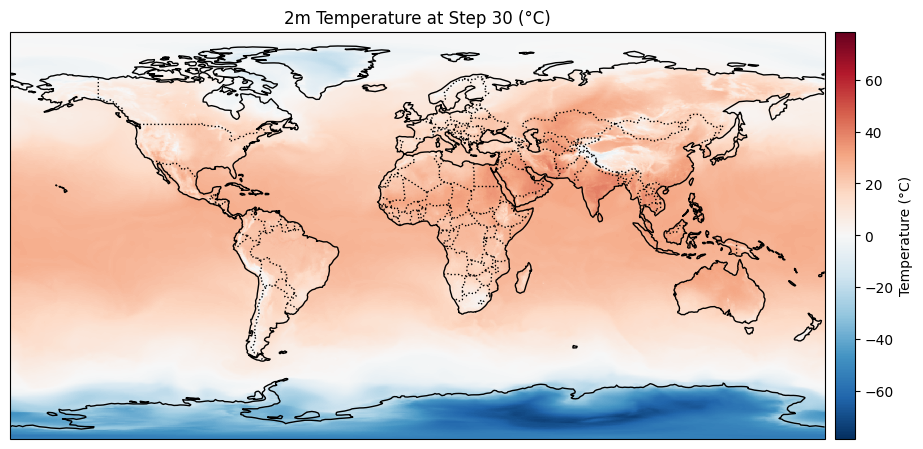

...

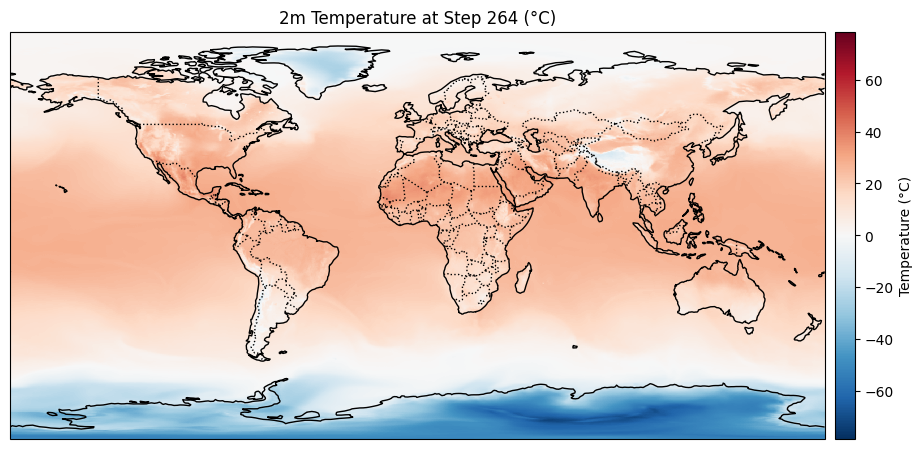

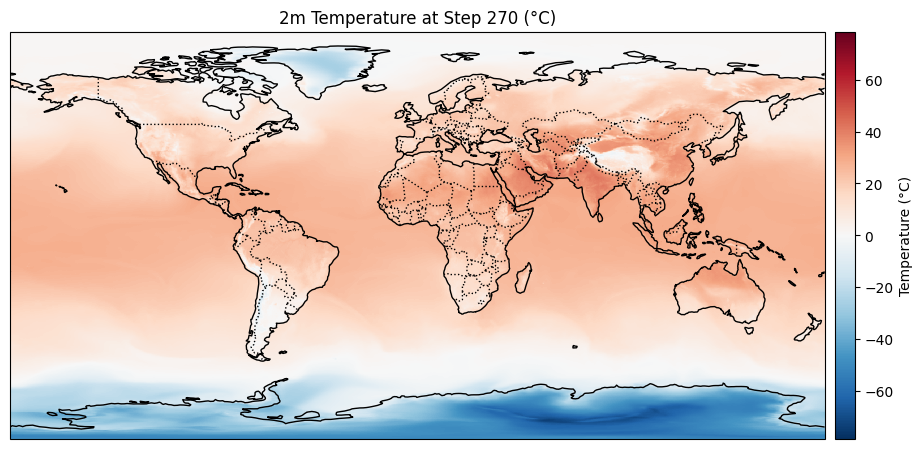

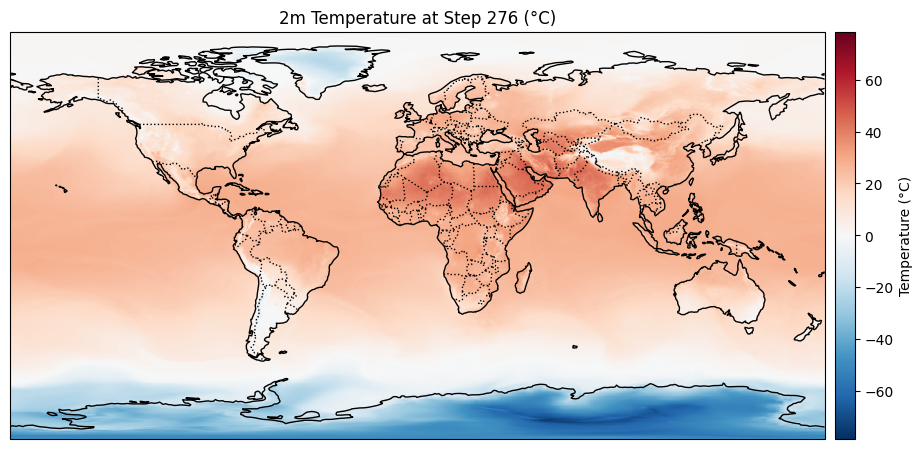

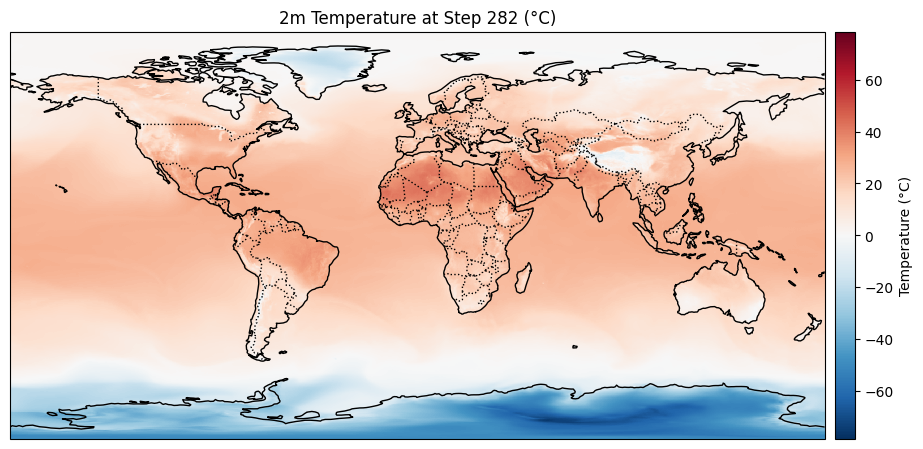

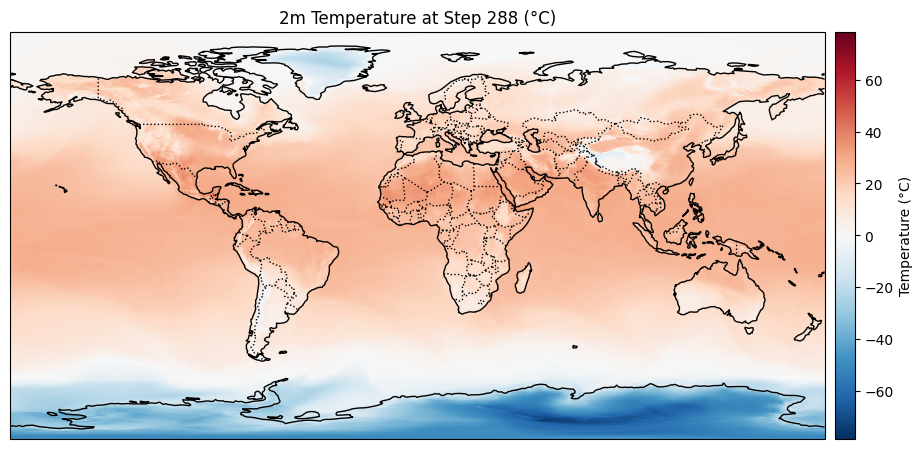

In [ ]:
import matplotlib.pyplot as plt
from cartopy import crs as ccrs
import cartopy.feature as cfeature

plot_ds = output_ds["2t"].isel(time=0) - 273.15
vmin = plot_ds.min().item()
vmax = plot_ds.max().item()

vmax = max(abs(vmin), abs(vmax))
vmin = -vmax

# plot_ds.plot(col='step', col_wrap=4, cmap='RdBu_r', vmin=vmin, vmax=vmax,)

for i in plot_ds.step.values:
    # if i > 6:
    #     continue
    plt.figure(figsize=(10, 5))
    ax = plt.axes(projection=ccrs.PlateCarree())
    c = ax.pcolormesh(
        plot_ds.lon,
        plot_ds.lat,
        plot_ds.sel(step=i),
        cmap='RdBu_r',
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree(),
    )
    plt.colorbar(c, ax=ax, orientation='vertical', label='Temperature (°C)', pad=0.01, shrink=0.865)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=":")
    ax.set_title(f"2m Temperature at Step {i} (°C)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    # plt.colorbar(label='Temperature (°C)')
    plt.tight_layout()
    plt.show()

In [15]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.tri as tri

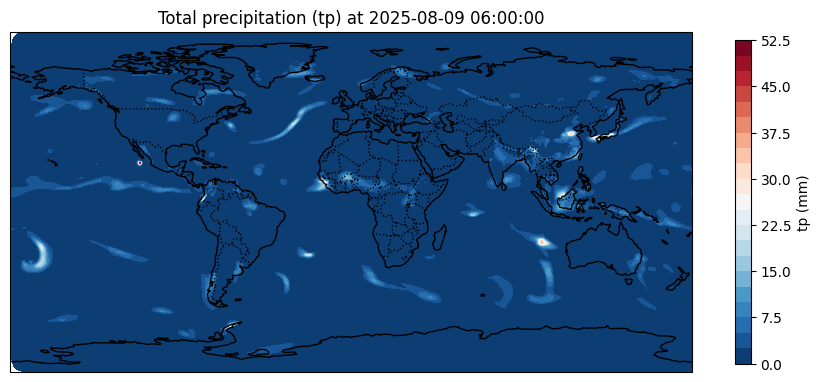

In [ ]:
def fix(lons):
    # Shift the longitudes from 0-360 to -180-180
    return np.where(lons > 180, lons - 360, lons)


latitudes = state["latitudes"]
longitudes = state["longitudes"]
# values = state["fields"]["2t"] - 273.15
values = state["fields"]["tp"] * 1000  # Convert tp to mm (from m to mm)

fig, ax = plt.subplots(figsize=(11, 6), subplot_kw={"projection": ccrs.PlateCarree()})
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=":")

triangulation = tri.Triangulation(fix(longitudes), latitudes)

contour = ax.tricontourf(
    triangulation, values, levels=20, transform=ccrs.PlateCarree(), cmap="RdBu_r"
)
cbar = fig.colorbar(contour, ax=ax, orientation="vertical", shrink=0.7, label="tp (mm)")

plt.title("Total precipitation (tp) at {}".format(state["date"]))
plt.show()